Introduction – In this section, you should describe the problem that you are solving, any background information that will help the instructors to understand the program.

Requirements - List all the Python modules that need to be installed. If some of these modules need a specific version, please indicate so. You can also list any other conditions that are needed to run the program.

Description of the Python program. You need to describe the programs that you wrote.

Screenshots of the program output - If you are using a specific hardware and cannot obtain screenshot, please enclose appropriate photographs.

Conclusion - Describe in brief the problem you solved, the program you wrote and obtained output.

Python program - If the program is one file, please add it as one of the pages in the report. If the code is large and spans more than one file, enclose a separate zip file.

If you are using a Jupyter notebook, make sure to add the above steps in Markdown cells and code cells. You add the link from where you obtained the data.

You will be evaluated based on the following:

Data preparation
Data visualization
Visualizing the learning process
Appropriate choice of architecture


Introduction – In this section, you should describe the problem that you are solving, any background information that will help the instructors to understand the program.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

In [2]:
housing = pd.read_csv('avg-household-size.csv')
print(housing.head())
print(housing.shape)

   statefips  countyfips  avghouseholdsize                           geography
0          2          13              2.43      Aleutians East Borough, Alaska
1          2          16              3.59  Aleutians West Census Area, Alaska
2          2          20              2.77      Anchorage Municipality, Alaska
3          2          50              3.86          Bethel Census Area, Alaska
4          2          60              2.50         Bristol Bay Borough, Alaska
(3220, 4)


In [3]:
# The household size dataset may be used if, during analysis, we think that avg household size or adding state information to each cancer_data row will be beneficial in our model
# We can map the household data by geography to the cancer_data dataset.
print(housing.describe())

         statefips   countyfips  avghouseholdsize
count  3220.000000  3220.000000       3220.000000
mean     31.290683   102.922050          2.540755
std      16.277207   106.693846          0.267654
min       1.000000     1.000000          1.370000
25%      19.000000    35.000000          2.380000
50%      30.000000    79.000000          2.510000
75%      46.000000   133.000000          2.650000
max      72.000000   840.000000          4.730000


In [4]:
cancer_data = pd.read_csv('cancer_reg.csv')
print(cancer_data.shape)

(3047, 33)


In [5]:
print(cancer_data.columns)

Index(['avganncount', 'avgdeathsperyear', 'target_deathrate', 'incidencerate',
       'medincome', 'popest2015', 'povertypercent', 'studypercap', 'binnedinc',
       'medianage', 'medianagemale', 'medianagefemale', 'geography',
       'percentmarried', 'pctnohs18_24', 'pcths18_24', 'pctsomecol18_24',
       'pctbachdeg18_24', 'pcths25_over', 'pctbachdeg25_over',
       'pctemployed16_over', 'pctunemployed16_over', 'pctprivatecoverage',
       'pctprivatecoveragealone', 'pctempprivcoverage', 'pctpubliccoverage',
       'pctpubliccoveragealone', 'pctwhite', 'pctblack', 'pctasian',
       'pctotherrace', 'pctmarriedhouseholds', 'birthrate'],
      dtype='object')


In [6]:
print(cancer_data.isnull().sum())

avganncount                   0
avgdeathsperyear              0
target_deathrate              0
incidencerate                 0
medincome                     0
popest2015                    0
povertypercent                0
studypercap                   0
binnedinc                     0
medianage                     0
medianagemale                 0
medianagefemale               0
geography                     0
percentmarried                0
pctnohs18_24                  0
pcths18_24                    0
pctsomecol18_24            2285
pctbachdeg18_24               0
pcths25_over                  0
pctbachdeg25_over             0
pctemployed16_over          152
pctunemployed16_over          0
pctprivatecoverage            0
pctprivatecoveragealone     609
pctempprivcoverage            0
pctpubliccoverage             0
pctpubliccoveragealone        0
pctwhite                      0
pctblack                      0
pctasian                      0
pctotherrace                  0
pctmarri

In [7]:
# since we have some Null values that may skew the data if we fill with unrelated data, we will drop those. We can also extrapolate the necessary information from other columns
# for example, pctsomecol18_24 can be generally covered by pctbachdeg18_24, pctemployed16_over can be generally covered by pctunemployed16_over

cancer_data = cancer_data.drop(['pctsomecol18_24', 'binnedinc', 'pctemployed16_over', 'pctprivatecoveragealone'], axis=1)


In [8]:
print(cancer_data.dtypes)

avganncount               float64
avgdeathsperyear            int64
target_deathrate          float64
incidencerate             float64
medincome                   int64
popest2015                  int64
povertypercent            float64
studypercap               float64
medianage                 float64
medianagemale             float64
medianagefemale           float64
geography                  object
percentmarried            float64
pctnohs18_24              float64
pcths18_24                float64
pctbachdeg18_24           float64
pcths25_over              float64
pctbachdeg25_over         float64
pctunemployed16_over      float64
pctprivatecoverage        float64
pctempprivcoverage        float64
pctpubliccoverage         float64
pctpubliccoveragealone    float64
pctwhite                  float64
pctblack                  float64
pctasian                  float64
pctotherrace              float64
pctmarriedhouseholds      float64
birthrate                 float64
dtype: object


In [9]:
#data cleaning : We think that the state might be a good column to test. So we need to convert all the counties and their state to just a state,
# and then from Categorical to Numerical
cancer_data_deep_copy = cancer_data.copy(deep=True) # saving cancer data as all original values

# re-writing geography with only state
cancer_data.geography = [(item.split(",")[-1]) for item in cancer_data.geography]


In [10]:
print(cancer_data.shape)
print(cancer_data.geography.value_counts())

(3047, 29)
geography
 Texas                   233
 Georgia                 155
 Virginia                125
 Kentucky                120
 Missouri                115
 Illinois                102
 Kansas                  102
 North Carolina           99
 Iowa                     99
 Tennessee                95
 Indiana                  92
 Ohio                     87
 Minnesota                87
 Michigan                 83
 Mississippi              82
 Nebraska                 80
 Oklahoma                 77
 Arkansas                 75
 Wisconsin                72
 Pennsylvania             67
 Florida                  66
 Louisiana                64
 Alabama                  63
 New York                 62
 Colorado                 60
 South Dakota             59
 California               57
 West Virginia            55
 North Dakota             51
 Montana                  48
 South Carolina           46
 Idaho                    42
 Washington               39
 Oregon               

In [11]:
cancer_data['geography'] = cancer_data['geography'].astype('category')

cancer_data['geography'] = cancer_data['geography'].cat.codes
# difficult to see what may be a good starting point here. Let's find the correlation points of each

corelation_values = cancer_data.corr()

In [12]:
sns.pairplot(cancer_data)
plt.show()

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

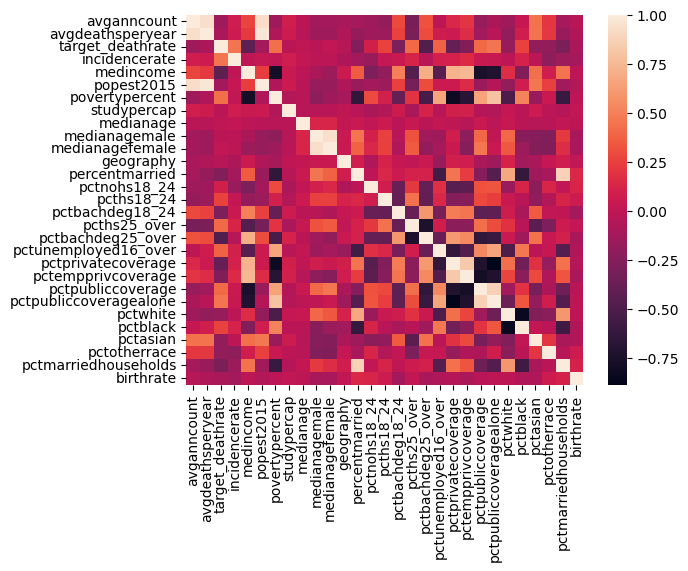

In [13]:
corr_heatmap = sns.heatmap(corelation_values, xticklabels=cancer_data.columns, yticklabels=cancer_data.columns)